After characterizing the resonator frequencies using frequency-domain spectroscopy, it is necessary to calibrate the "blob" separataion in phase space. This notebook outlines how to do this for qubits and qutrits.

# Imports & Setup

In [ ]:
import logging
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import scipy

import qcal as qc

from qcal.units import *
from qcal.backend.qubic.qpu import QubicQPU # Hardware backend
from qcal.calibration.readout import ReadoutCalibration, Separation, Fidelity

import plotly.io as pio
pio.renderers.default = 'colab'

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

logging.basicConfig(level=logging.INFO)

%load_ext autoreload
%autoreload 2

In [ ]:
import qcal.settings as settings

basedir = '/some/path/to/an/experimental/directory/'
settings.Settings.config_path = basedir + 'configs/'  # This is where the config.yaml file should live
settings.Settings.data_path = basedir + 'data/'       # This is the base directory where all data is saved
settings.Settings.save_data = True                    # This setting controls whether or not to automatically save data

# QubiC hardware backend settings
ip_address = 'ip.address.for.board'
port = 'port'

cfg = qc.Config()
cfg.draw_qpu()

In [ ]:
cfg.plot_readout_freqs()

# Qubit Readout

To calibrate qubit readout, we need to prepare each of our computational basis states (e.g., |0⟩ and |1⟩) and plot the measured results in phase space. We then train a "classifier" (e.g., some clustering algorithm) to classify the results in phase space, and this classifier is then later used to classify the results of any quantum circuit. The ```ReadoutCalibration``` class does this for us. It prepares the computational basis states (up to ```n=3``` energy levels) and classifies the results using a Gaussian Mixture Model (GMM). Other models are possible, but are not currently supported.

Every time ```ReadoutCalibration``` is run, the trained classifier is saved as a ```ClassificationManager.pkl``` file in the same directory as the ```config.yaml``` file. This classifier is automatically loaded from file and used to classify the results of other circuits whenever the backend QPU is instantiated, unless a custom classifier is passed to the QPU using the ```classifier``` kwarg. It is important to note that the ```ClassificationManager``` can only classify the qubits that were trained in ```ReadoutCalibration```; if you try to classify the results of a qubit that was not trained, you'll received an error.

***NOTE: as we move from the frequency domain to the time domain, it is important to keep track of your herald settings (```cfg['readout/herald/enable']```) and your passive reset delay (```cfg['reset/passive/delay']```). In time domain, it is often useful to herald your circuits by setting ```cfg['readout/herald/enable'] = True``` (or changing it manually in your config file), which measures your qubits before a circuits and throws out any results in which a qubit is not initialized in |0⟩. Also, if using passive reset, your passive reset delay should be set to ~5× the T1 times of your qubits.***

INFO:QPU: Data save location: /Users/akel/Experiments/data/2025-12-15/20251215_121442_RCal_Q0Q1Q2Q3Q4Q5Q6Q7/



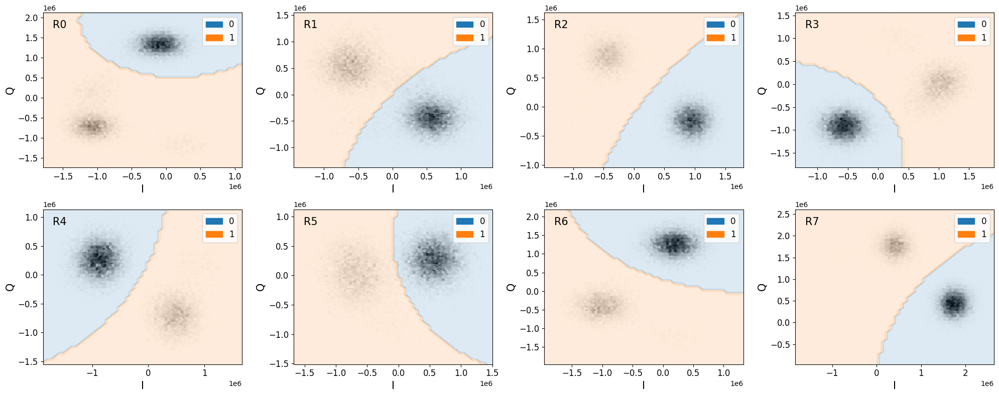


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0      1.0      0.0    1.0



In [ ]:
cfg.load()

cal = ReadoutCalibration(
    QubicQPU,
    cfg,
    qubits=cfg.qubits,
    n_levels=2,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=10000,
    save_raw_data=True,
    # QubiC-specific kwargs
    ip_address=ip_address,
    port=port
)
cal.run()

As we see in the plot above, we can successfully see two distinct states (|0⟩ and |1⟩) in phase space for each qubit. However, the separation between the two states might not be optimal (we will show how to calibrate these below).

Below, we display the two circuits that were used to prepare the two computational basis states for ```ReadoutCalibration```. This example demonstrates that each calibration class instance (```cal```) has an associated ```CircuitSet``` (```cal.circuits```), and the circuits in the ```CircuitSet``` can be indexed and display with the ```draw()``` method.

In [ ]:
cal.circuits[0].draw()

In [ ]:
cal.circuits[1].draw()

We can also plot the raw data using ```cal.plot(raw=True)```, which can be a useful diagnostic tool. We observe that for many of the qubits, when we prepare |1⟩ we often see it decay to |0⟩. This suggests that the readout is likely T1 limited, or perhaps that we are driving too hard and observing measurement-induced state transitions (MIST). The appear of an additional third blob for several of the qubits (e.g., 0) suggests that the latter might be the case.

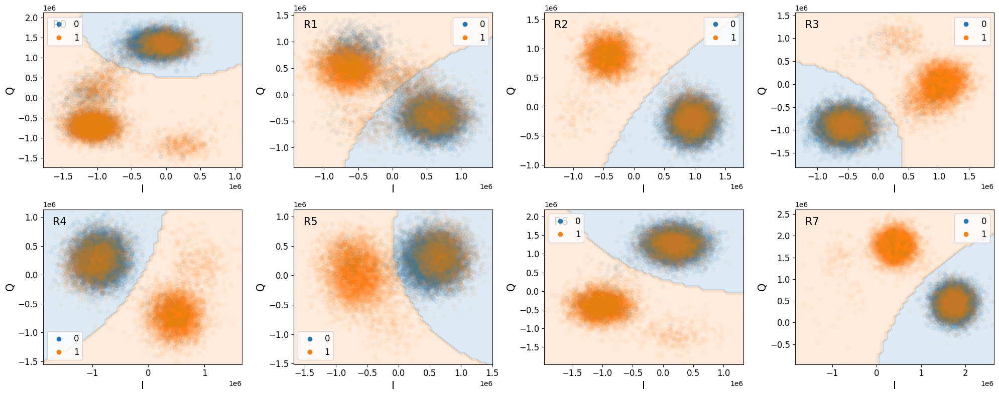

In [ ]:
cal.plot(raw=True)

## Separation (SNR)

The first step in calibrating readout in time-domain is to optimize the signal-to-noise ratio (i.e., state separation in phase space). We can optimize SNR with respect to any free variable in our readout. Below, we show how to optimize SNR using the ```Separation``` class with respect to readout frequency, demodulation time, demodulation delay, and pulse shape.

The ```Separation``` class takes three main arguments:


1. Qubit labels (```qubits```)
2. A dictionary of mapping a qubit label to the config parameter that we are going to sweep over (```params```)
3. A dictionary mapping a qubit label to the values over which we are going to sweep the parameter (```param_sweep```)

Below, we set up an experiment where we sweep the readout frequency around +/- 2.5 MHz around the current value for all 8 qubits on the quantum processor. For each frequency value, the ```Separation``` class performs ```ReadoutCalibration``` and calculates the separation between the two states. The readout is optized for frequency values where the separation is maximized.


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0      3.8      0.0    3.8



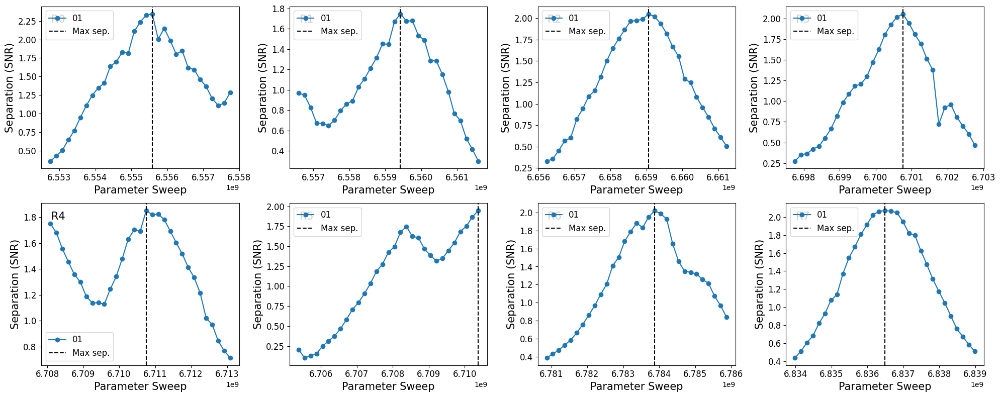

INFO:qcal.config: Param ['readout', 0, 'freq'] set to 6555583520.88504.
INFO:qcal.config: Param ['readout', 1, 'freq'] set to 6559421160.70453.
INFO:qcal.config: Param ['readout', 2, 'freq'] set to 6659059601.2048.
INFO:qcal.config: Param ['readout', 3, 'freq'] set to 6700754740.5311.
INFO:qcal.config: Param ['readout', 4, 'freq'] set to 6710752739.2282.
INFO:qcal.config: Param ['readout', 5, 'freq'] set to 6710380240.56934.
INFO:qcal.config: Param ['readout', 6, 'freq'] set to 6783874623.57373.
INFO:qcal.config: Param ['readout', 7, 'freq'] set to 6836486433.90443.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/freq' for q in qubits}
param_sweep = { # +/- delta MHz sweep around the current frequency
    q: np.linspace(-2.5, 2.5, 31) * MHz
    + cfg[f'readout/{q}/freq'] for q in qubits
}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_levels=2,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=3000,
    # QubiC-specific kwargs
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

This experiment demonstrates that we should fine-tune the readout frequency by maximizing separation in phase space, which might not always equal the value we measure from spectroscopy.

Below, we optimize duration of the demodulation (i.e., integration) pulse by sweeping +/- 50 ns around the current value:


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      3.6      0.0    3.7



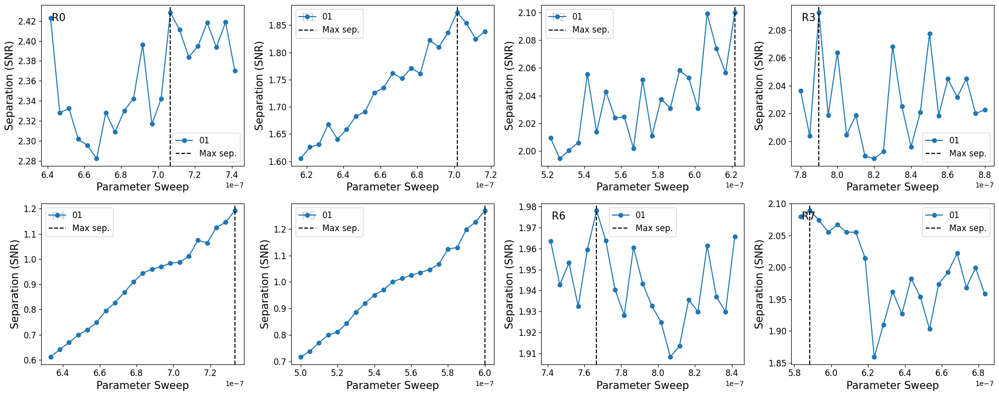

INFO:qcal.config: Param ['readout', 0, 'demod', 'time'] set to 7.0667e-07.
INFO:qcal.config: Param ['readout', 1, 'demod', 'time'] set to 7.0167e-07.
INFO:qcal.config: Param ['readout', 2, 'demod', 'time'] set to 6.2167e-07.
INFO:qcal.config: Param ['readout', 3, 'demod', 'time'] set to 7.9e-07.
INFO:qcal.config: Param ['readout', 4, 'demod', 'time'] set to 7.3333e-07.
INFO:qcal.config: Param ['readout', 5, 'demod', 'time'] set to 6e-07.
INFO:qcal.config: Param ['readout', 6, 'demod', 'time'] set to 7.6667e-07.
INFO:qcal.config: Param ['readout', 7, 'demod', 'time'] set to 5.8833e-07.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/demod/time' for q in qubits}
# param_sweep = [np.linspace(0.4, 1.0, 31) * us] * len(qubits)
param_sweep = { # +/- 50 ns sweep around the current delay
    q: np.linspace(-50, 50, 21) * ns
    + cfg[f'readout/{q}/demod/time'] for q in qubits
}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_levels=2,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=3000,
    # QubiC-specific kwargs
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

Below, we optimize the integration delay (i.e., the delay between the readout and demod pulses) by sweeping +/- 100 ns around the current value:


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      3.6      0.0    3.7



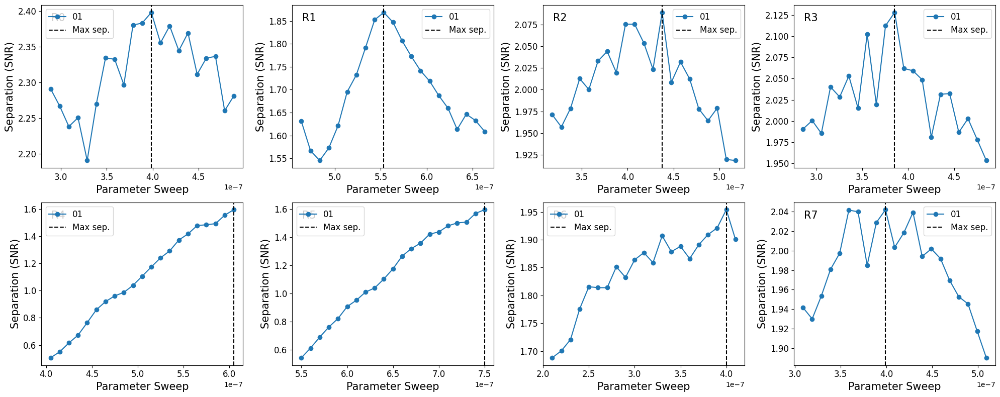

INFO:qcal.config: Param ['readout', 0, 'demod', 'delay'] set to 3.9857e-07.
INFO:qcal.config: Param ['readout', 1, 'demod', 'delay'] set to 5.5333e-07.
INFO:qcal.config: Param ['readout', 2, 'demod', 'delay'] set to 4.3763e-07.
INFO:qcal.config: Param ['readout', 3, 'demod', 'delay'] set to 3.8523e-07.
INFO:qcal.config: Param ['readout', 4, 'demod', 'delay'] set to 6.0476e-07.
INFO:qcal.config: Param ['readout', 5, 'demod', 'delay'] set to 7.5e-07.
INFO:qcal.config: Param ['readout', 6, 'demod', 'delay'] set to 4e-07.
INFO:qcal.config: Param ['readout', 7, 'demod', 'delay'] set to 3.9905e-07.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/demod/delay' for q in qubits}
# param_sweep = [np.linspace(250, 650, 31) * ns] * len(qubits)
param_sweep = {q: # +/- 50 ns sweep around the current delay
    np.linspace(-100, 100, 21) * ns
    + cfg[f'readout/{q}/demod/delay'] for q in qubits
}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_levels=2,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=3000,
    # QubiC-specific kwargs
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

Below, we optimize the integration weights for each moment in time by sweeping the ramp fraction of the demod pulse between 0.01 and 0.49:


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      3.6      0.0    3.7



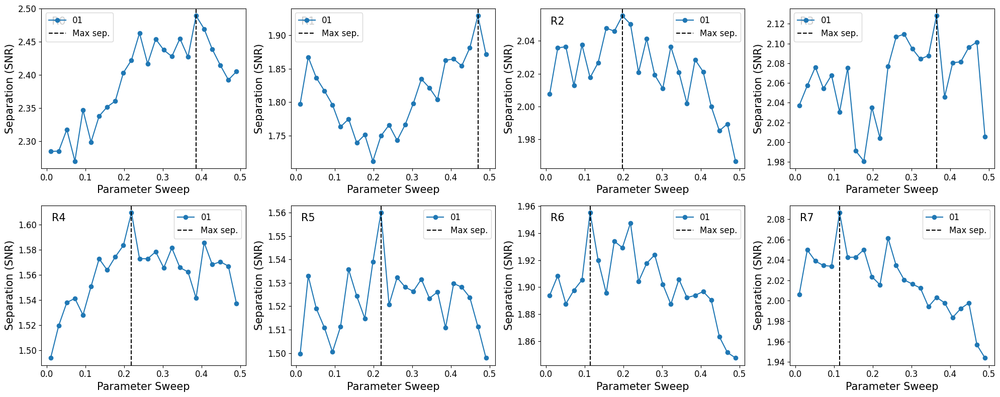

INFO:qcal.config: Param ['readout', 0, 'demod', 'kwargs', 'ramp_fraction'] set to 0.38565217.
INFO:qcal.config: Param ['readout', 1, 'demod', 'kwargs', 'ramp_fraction'] set to 0.46913043.
INFO:qcal.config: Param ['readout', 2, 'demod', 'kwargs', 'ramp_fraction'] set to 0.19782609.
INFO:qcal.config: Param ['readout', 3, 'demod', 'kwargs', 'ramp_fraction'] set to 0.36478261.
INFO:qcal.config: Param ['readout', 4, 'demod', 'kwargs', 'ramp_fraction'] set to 0.21869565.
INFO:qcal.config: Param ['readout', 5, 'demod', 'kwargs', 'ramp_fraction'] set to 0.21869565.
INFO:qcal.config: Param ['readout', 6, 'demod', 'kwargs', 'ramp_fraction'] set to 0.11434783.
INFO:qcal.config: Param ['readout', 7, 'demod', 'kwargs', 'ramp_fraction'] set to 0.11434783.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/demod/kwargs/ramp_fraction' for q in qubits}
param_sweep = {q: np.linspace(0.01, 0.49, 24) for q in qubits}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_levels=2,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=3000,
    save_raw_data=True,
    # QubiC-specific kwargs
    ip_address=ip_address,
    port=port
)
cal.run()

Finally, we can re-run ```ReadoutCalibration``` to generate a new ```ClassificationManager.pkl``` file:

INFO:QPU: Data save location: /Users/akel/Experiments/data/2025-12-15/20251215_124939_RCal_Q0Q1Q2Q3Q4Q5Q6Q7/



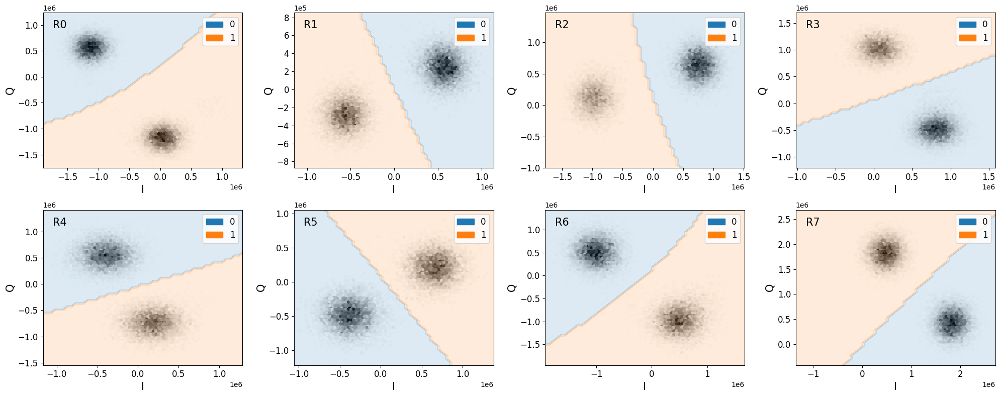


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0     11.6      0.0   11.7



In [ ]:
cfg.load()

cal = ReadoutCalibration(
    QubicQPU,
    cfg,
    qubits=cfg.qubits,
    gate='X90',
    n_levels=2,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=10000,
    save_raw_data=True,
    # QubiC-specific kwargs
    ip_address=ip_address,
    port=port
)
cal.run()

We observe that the readout blobs are much more well-separated. We also observe from the raw data plotted below that we observe less MIST and less T1 decay.

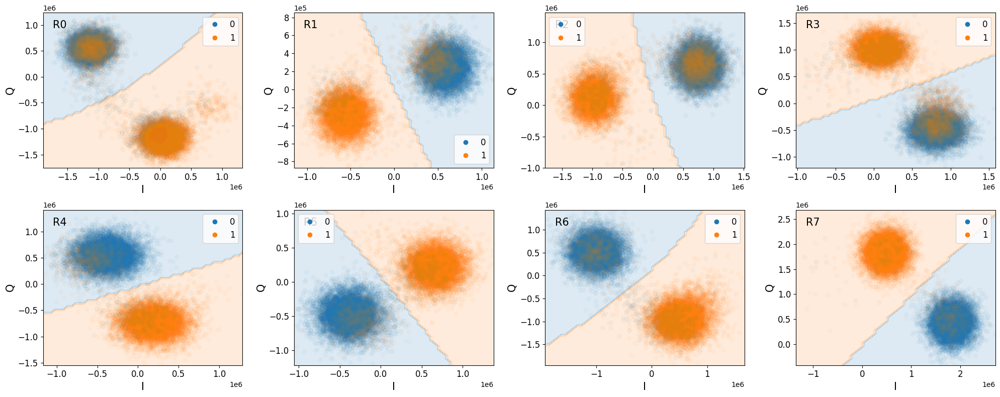

In [ ]:
cal.plot(raw=True)

## Fidelity

The final step in optimizing readout is to optimized the readout fidelity. Similar to the ```Separation``` class, we can optimize the fidelity with respect to any free parameter. However, often it is sufficient to optimize readout fidelity with respect to readout amplitude, which we demonstrate below.

***NOTE: Before running this, it is suggested that you calibrate single-qubit gates, because this calibration requires good state-preparation.***

The ```Fidelity``` class takes the same set of parameters as ```Separation``` class. However, in this case we maximize on the probability of preparing the |0⟩ and |1⟩ states, i.e., P(0|0) and P(1|1). The amplitude which maximizes P(0|0) and P(1|1) might not be the same for both, so this calibration class find the amplitude which maximizes the combination of both. Below, we sweep +/- 0.005 (in arbitrary machine units) around the current amplitude value for eadh readout:


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0      3.6      0.0    3.6



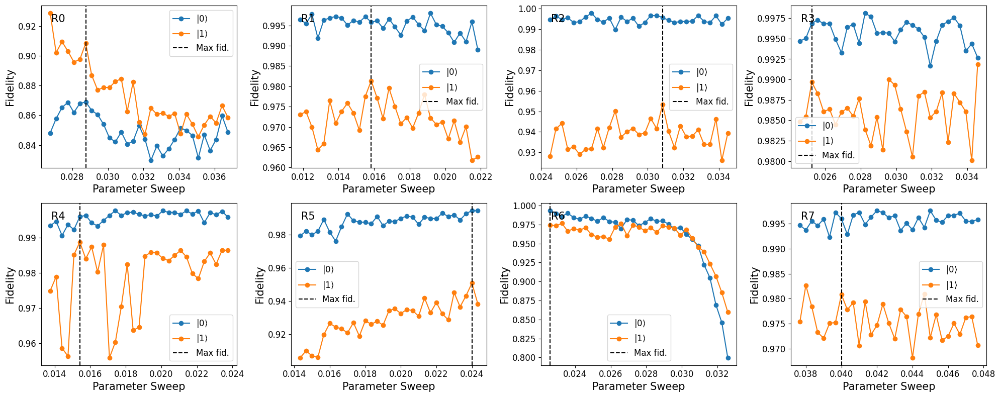

INFO:qcal.config: Param ['readout', 0, 'amp'] set to 0.02875.
INFO:qcal.config: Param ['readout', 1, 'amp'] set to 0.015833333.
INFO:qcal.config: Param ['readout', 2, 'amp'] set to 0.030833333.
INFO:qcal.config: Param ['readout', 3, 'amp'] set to 0.02525.
INFO:qcal.config: Param ['readout', 4, 'amp'] set to 0.015416667.
INFO:qcal.config: Param ['readout', 5, 'amp'] set to 0.024.
INFO:qcal.config: Param ['readout', 6, 'amp'] set to 0.022583334.
INFO:qcal.config: Param ['readout', 7, 'amp'] set to 0.04.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/amp' for q in qubits}
param_sweep = {
    q: np.linspace(-0.005, 0.005, 31)
    + cfg[f'readout/{q}/amp'] for q in qubits
}

cal = Fidelity(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    # Optional kwargs
    n_circs_per_seq=31,
    n_shots=3000,
    n_levels=2,
    # save_raw_data=True,
    ip_address=ip_address,
    port=port
  )
cal.run()

We observe that for some qubits, we need to readout harder (e.g., 5), and for others, we need to readout weaker (e.g., 6). Finally, we re-run ```ReadoutCalibration``` to generate a new ```ClassificationManager.pkl``` file:

INFO:QPU: Data save location: /Users/akel/Experiments/data/2025-12-16/20251216_111257_RCal_Q0Q1Q2Q3Q4Q5Q6Q7/



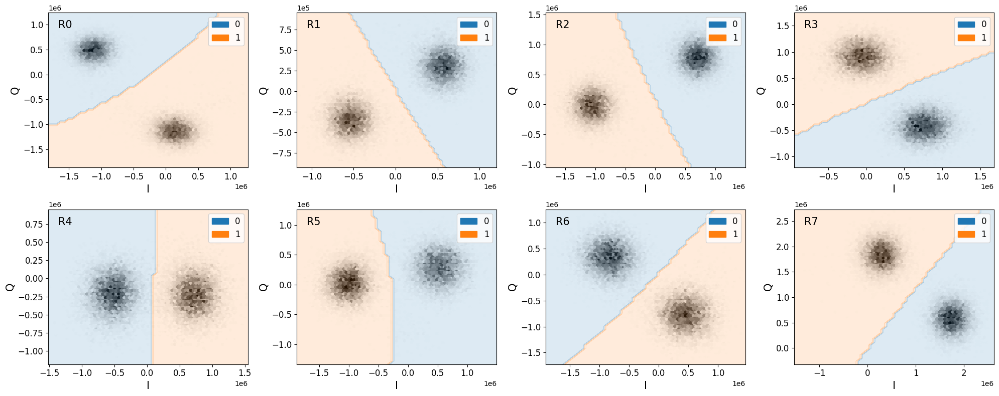


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0     11.6      0.0   11.7



In [ ]:
cfg.load()

cal = ReadoutCalibration(
    QubicQPU,
    cfg,
    qubits=cfg.qubits,
    # Optional kwargs
    n_circs_per_seq=2,
    n_shots=10000,
    n_levels=2,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

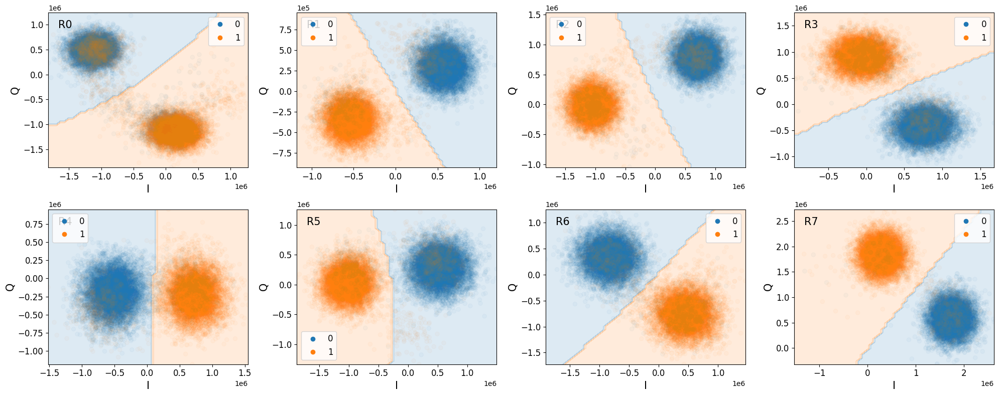

In [ ]:
cal.plot(raw=True)

# Qutrit Readout

In this section, we demonstrate that we can also calibrate qutrit readout using the same calibration methods. The calibration for qubit readout is not always optimal for qutrit readout; e.g., the readout frequency usually needs to be different for qutrit readout. The ```ReadoutCalibration```, ```Separation```, and ```Fidelity``` classes can be easily modified for qutrit readout by simply changing ```n_levels = 2``` to ```n_levels = 3```.

***NOTE: you should manually delete the ```ClassificationManager.pkl``` file for ```n_levels = 2``` before running ```ReadoutCalibration``` for ```n_levels = 3```, because the parent ```QPU``` class does not permit classifying more levels than the current ```ClassificationManager.pkl``` is trained to classify.***

INFO:QPU: Data save location: /Users/akel/Experiments/data/2025-12-16/20251216_114122_RCal_Q0Q1Q2Q3Q4Q5Q6Q7/



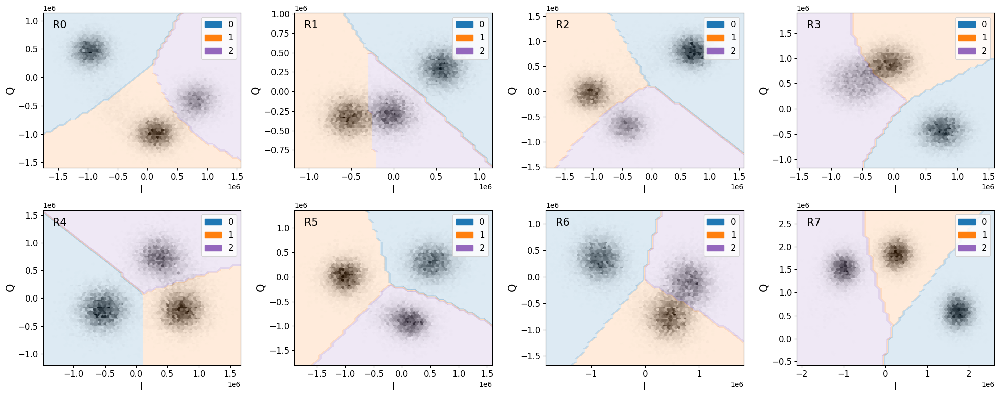


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0     17.4      0.0   17.4



In [ ]:
cfg.load()

cal = ReadoutCalibration(
    QubicQPU,
    cfg,
    qubits=cfg.qubits,
    n_circs_per_seq=3,
    n_shots=10000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

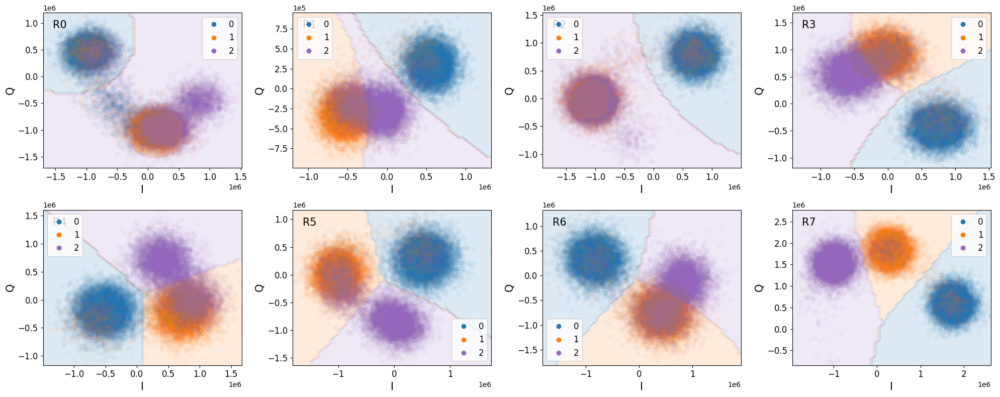

In [ ]:
cal.plot(raw=True)

## Separation (SNR)


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      5.9      0.0    6.0



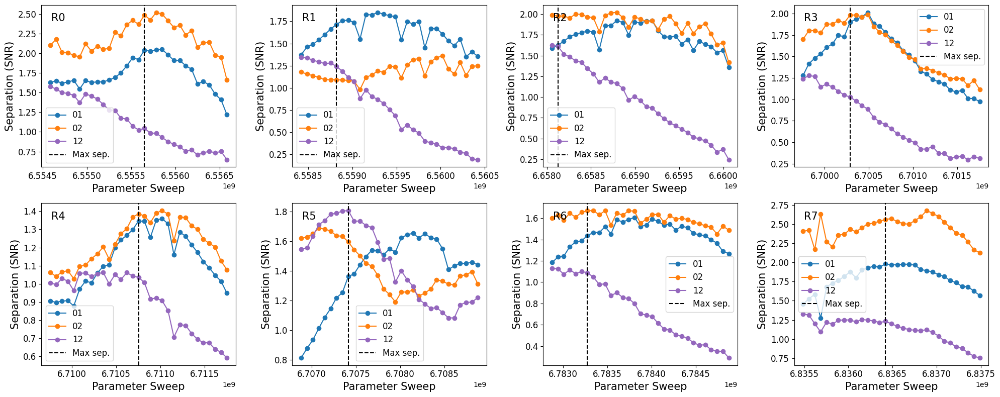

INFO:qcal.config: Param ['readout', 0, 'freq'] set to 6555650187.55171.
INFO:qcal.config: Param ['readout', 1, 'freq'] set to 6558821160.70453.
INFO:qcal.config: Param ['readout', 2, 'freq'] set to 6658126267.87147.
INFO:qcal.config: Param ['readout', 3, 'freq'] set to 6700288073.86443.
INFO:qcal.config: Param ['readout', 4, 'freq'] set to 6710752739.2282.
INFO:qcal.config: Param ['readout', 5, 'freq'] set to 6707413573.90267.
INFO:qcal.config: Param ['readout', 6, 'freq'] set to 6783274623.57373.
INFO:qcal.config: Param ['readout', 7, 'freq'] set to 6836419767.23776.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/freq' for q in qubits}
param_sweep = { # +/- delta MHz sweep around the current frequency
    q: np.linspace(-1, 1, 31) * MHz
    + cfg[f'readout/{q}/freq'] for q in qubits
}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_circs_per_seq=3,
    n_shots=3000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      5.4      0.0    5.6



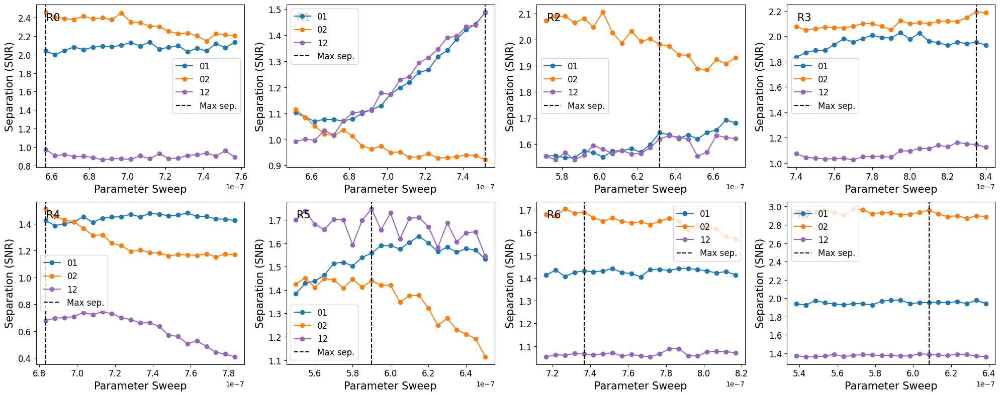

INFO:qcal.config: Param ['readout', 0, 'demod', 'time'] set to 6.5667e-07.
INFO:qcal.config: Param ['readout', 1, 'demod', 'time'] set to 7.5167e-07.
INFO:qcal.config: Param ['readout', 2, 'demod', 'time'] set to 6.3167e-07.
INFO:qcal.config: Param ['readout', 3, 'demod', 'time'] set to 8.35e-07.
INFO:qcal.config: Param ['readout', 4, 'demod', 'time'] set to 6.8333e-07.
INFO:qcal.config: Param ['readout', 5, 'demod', 'time'] set to 5.9e-07.
INFO:qcal.config: Param ['readout', 6, 'demod', 'time'] set to 7.3667e-07.
INFO:qcal.config: Param ['readout', 7, 'demod', 'time'] set to 6.0833e-07.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/demod/time' for q in qubits}
# param_sweep = [np.linspace(0.4, 1.0, 31) * us] * len(qubits)
param_sweep = { # +/- 50 ns sweep around the current delay
    q: np.linspace(-50, 50, 21) * ns
    + cfg[f'readout/{q}/demod/time'] for q in qubits
}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_circs_per_seq=3,
    n_shots=3000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      5.7      0.0    5.8



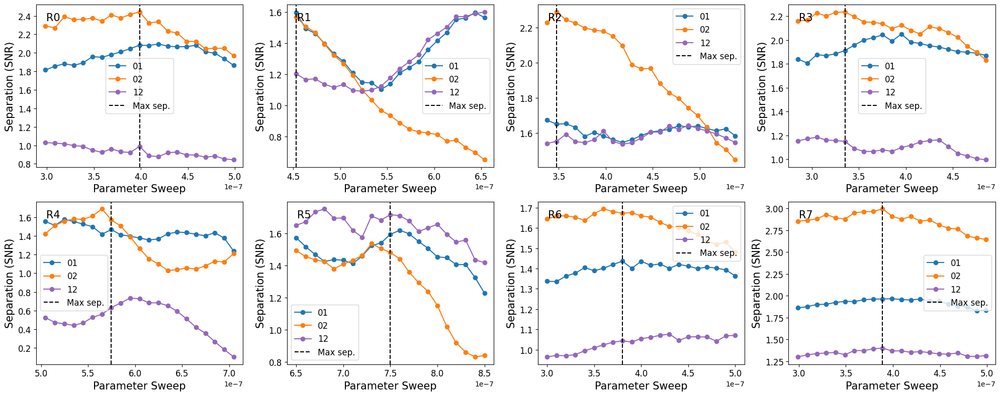

INFO:qcal.config: Param ['readout', 0, 'demod', 'delay'] set to 3.9857e-07.
INFO:qcal.config: Param ['readout', 1, 'demod', 'delay'] set to 4.5333e-07.
INFO:qcal.config: Param ['readout', 2, 'demod', 'delay'] set to 3.4763e-07.
INFO:qcal.config: Param ['readout', 3, 'demod', 'delay'] set to 3.3523e-07.
INFO:qcal.config: Param ['readout', 4, 'demod', 'delay'] set to 5.7476e-07.
INFO:qcal.config: Param ['readout', 5, 'demod', 'delay'] set to 7.5e-07.
INFO:qcal.config: Param ['readout', 6, 'demod', 'delay'] set to 3.8e-07.
INFO:qcal.config: Param ['readout', 7, 'demod', 'delay'] set to 3.8905e-07.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/demod/delay' for q in qubits}
# param_sweep = [np.linspace(250, 650, 31) * ns] * len(qubits)
param_sweep = {q: # +/- 50 ns sweep around the current delay
    np.linspace(-100, 100, 21) * ns
    + cfg[f'readout/{q}/demod/delay'] for q in qubits
}

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_circs_per_seq=3,
    n_shots=3000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.1    0.0      5.9      0.0    6.0



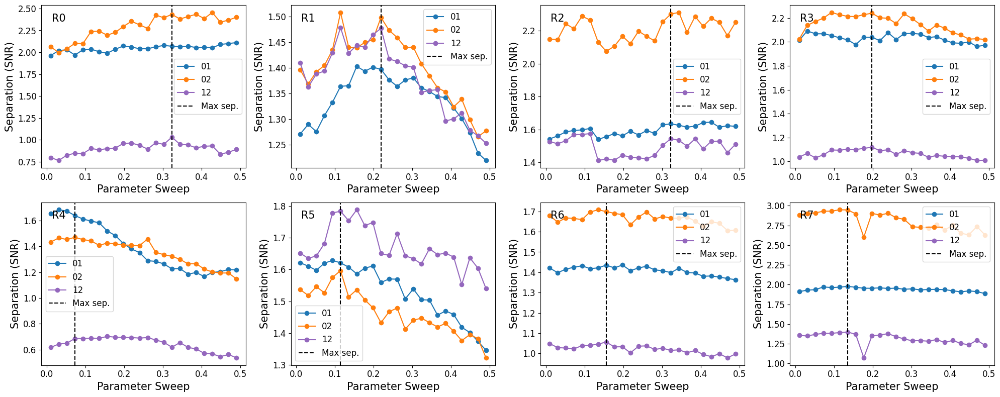

INFO:qcal.config: Param ['readout', 0, 'demod', 'kwargs', 'ramp_fraction'] set to 0.32304348.
INFO:qcal.config: Param ['readout', 1, 'demod', 'kwargs', 'ramp_fraction'] set to 0.21869565.
INFO:qcal.config: Param ['readout', 2, 'demod', 'kwargs', 'ramp_fraction'] set to 0.32304348.
INFO:qcal.config: Param ['readout', 3, 'demod', 'kwargs', 'ramp_fraction'] set to 0.19782609.
INFO:qcal.config: Param ['readout', 4, 'demod', 'kwargs', 'ramp_fraction'] set to 0.072608696.
INFO:qcal.config: Param ['readout', 5, 'demod', 'kwargs', 'ramp_fraction'] set to 0.11434783.
INFO:qcal.config: Param ['readout', 6, 'demod', 'kwargs', 'ramp_fraction'] set to 0.15608696.
INFO:qcal.config: Param ['readout', 7, 'demod', 'kwargs', 'ramp_fraction'] set to 0.13521739.


In [ ]:
cfg.load()

qubits = cfg.qubits
params = {q: f'readout/{q}/demod/kwargs/ramp_fraction' for q in qubits}
param_sweep = {q: np.linspace(0.01, 0.49, 24) for q in qubits}
# param_sweep = {
#     q: np.linspace(-0.1, 0.1, 21)
#     + cfg[f'readout/{q}/demod/kwargs/ramp_fraction'] for q in qubits
# }

cal = Separation(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_circs_per_seq=3,
    n_shots=3000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

INFO:QPU: Data save location: /Users/akel/Experiments/data/2025-12-16/20251216_120357_RCal_Q0Q1Q2Q3Q4Q5Q6Q7/



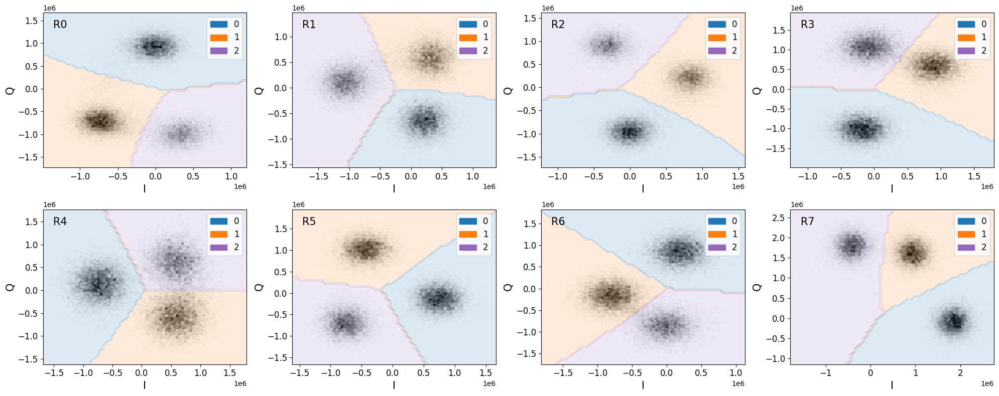


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0     17.6      0.0   17.6



In [ ]:
cfg.load()

cal = ReadoutCalibration(
    QubicQPU,
    cfg,
    qubits=cfg.qubits,
    n_circs_per_seq=3,
    n_shots=10000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

## Fidelity


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0      5.7      0.0    5.8



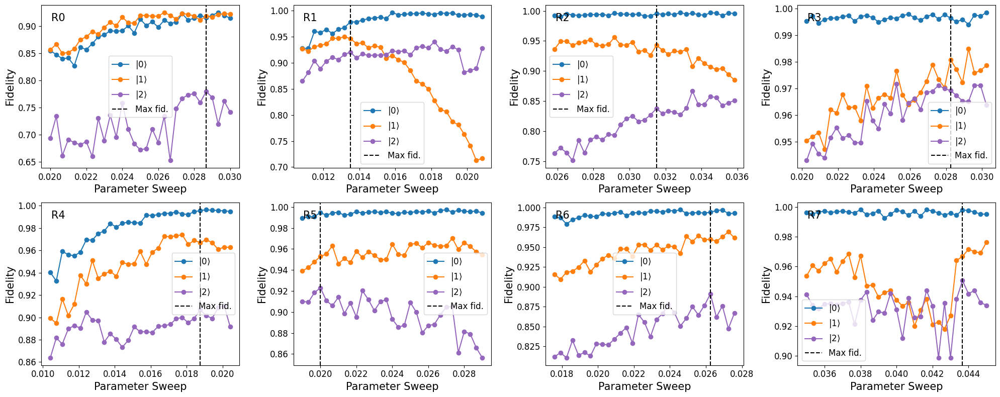

INFO:qcal.config: Param ['readout', 0, 'amp'] set to 0.028666667.
INFO:qcal.config: Param ['readout', 1, 'amp'] set to 0.0135.
INFO:qcal.config: Param ['readout', 2, 'amp'] set to 0.0315.
INFO:qcal.config: Param ['readout', 3, 'amp'] set to 0.02825.
INFO:qcal.config: Param ['readout', 4, 'amp'] set to 0.01875.
INFO:qcal.config: Param ['readout', 5, 'amp'] set to 0.02.
INFO:qcal.config: Param ['readout', 6, 'amp'] set to 0.026250001.
INFO:qcal.config: Param ['readout', 7, 'amp'] set to 0.043666667.


In [ ]:
cfg.load()

qubits = cfg.qubits

# cfg['readout/esp/enable'] = False
params = {q: f'readout/{q}/amp' for q in qubits}
param_sweep = {
    q: np.linspace(-0.005, 0.005, 31)
    + cfg[f'readout/{q}/amp'] for q in qubits
}

cal = Fidelity(
    QubicQPU,
    cfg,
    qubits=qubits,
    params=params,
    param_sweep=param_sweep,
    n_circs_per_seq=31,
    n_shots=3000,
    n_levels=3,
    # save_raw_data=True,
    ip_address=ip_address,
    port=port
  )
cal.run()

INFO:QPU: Data save location: /Users/akel/Experiments/data/2025-12-16/20251216_123311_RCal_Q0Q1Q2Q3Q4Q5Q6Q7/



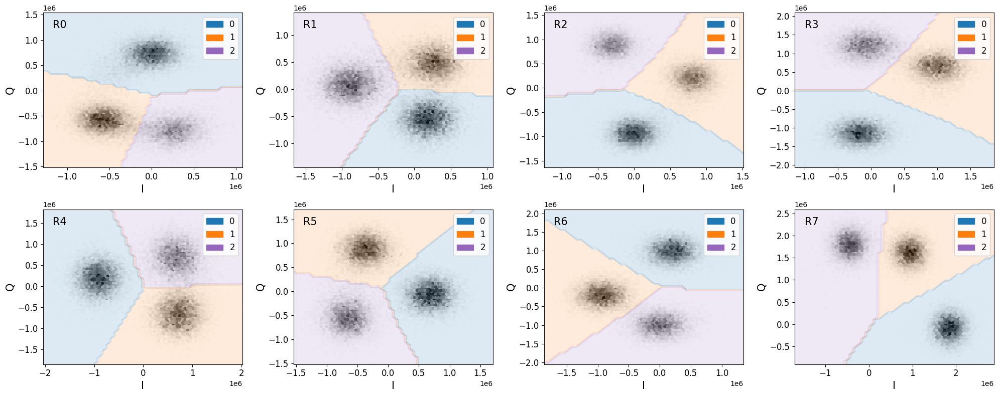


Runtime:   Compile  Transpile  Sequencing  Write  Measure  Process  Total
Time (s)      0.0        0.0         0.0    0.0     17.4      0.0   17.5



In [ ]:
cfg.load()

cal = ReadoutCalibration(
    QubicQPU,
    cfg,
    qubits=cfg.qubits,
    n_circs_per_seq=3,
    n_shots=10000,
    n_levels=3,
    save_raw_data=True,
    ip_address=ip_address,
    port=port
)
cal.run()

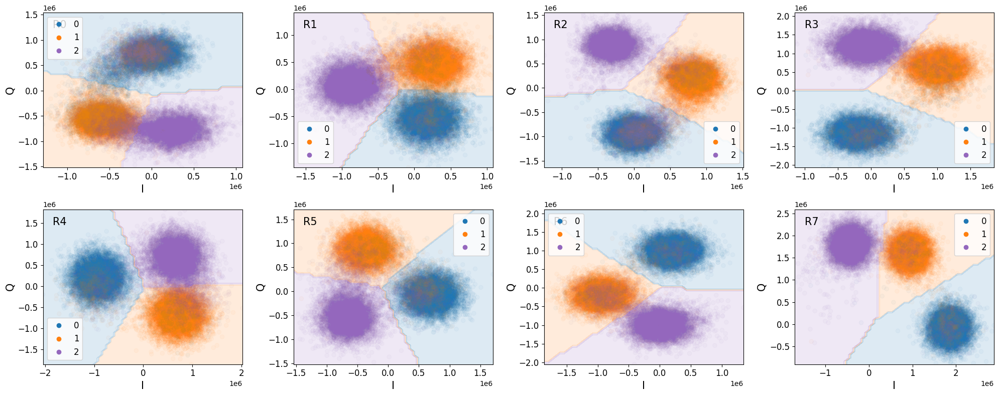

In [ ]:
cal.plot(raw=True)